Optional code if PyTorch or torchaudio is unavailable.

In [ ]:
#!pip install torch>=1.2.0
#!pip install torchaudio
!pip install torch==1.8.0+cu111 torchvision==0.9.0+cu111 torchaudio==0.8.0 -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |█████████████▌                  | 834.1MB 1.5MB/s eta 0:12:53tcmalloc: large alloc 1147494400 bytes == 0x5577ac75c000 @  0x7f21d30db615 0x55777342f06c 0x55777350eeba 0x557773431e8d 0x55777352399d 0x5577734a5fe9 0x5577734a0b0e 0x55777343377a 0x5577734a5e50 0x5577734a0b0e 0x55777343377a 0x5577734a286a 0x5577735247c6 0x5577734a1ee2 0x5577735247c6 0x5577734a1ee2 0x5577735247c6 0x5577734a1ee2 0x5577735247c6 0x5577735a6431 0x557773507049 0x557773471c84 0x5577734328e9 0x5577734a6ade 0x55777343369a 0x5577734a1a45 0x5577734a0e0d 0x55777343377a 0x5577734a1a45 0x55777343369a 0x5577734a1a45
     |█████████████████               | 1055.7MB 1.4MB/s eta 0:11:10tcmalloc: large alloc 1434370048 bytes == 0x5577f0db2000 @  0x7f21d30db615 0x55777342f06c 0x55777350eeba 0x557773431e8d 0x55777352399d 0x5577734a5fe9 0x5577734a0b0e 0x55777343377a 0x5577734a5e50 0x5577734a0b0e 0x55777343377a 0x5577734a286a 0x5577735247c6 0x5577734a1ee2 0


# APS360 Project - Group 96
## Music Genre Classification

Sohee - dataset preparation

David Lee - Baseline model

David Song / Sherman - Primary model





# 1. Data Processing

Data processing collab link: https://colab.research.google.com/drive/1malre7gz89f5SxFNw4Ied3hyNUcHScJn?usp=sharing



In [ ]:
# link to the Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

PATH_OF_DATA= '/content/drive/MyDrive/"ECE Year 3"/"Semester 2"/APS360/"Group Project"'
!ls {PATH_OF_DATA}

Mounted at /content/drive
'APS360 Group 96 Project.ipynb'  'Final Work Allocation.gdoc'
 Brainstorming.gdoc		 'Gantt Chart.gsheet'
 dataset			 'Group 96 - Project Proposal.gdoc'
 dataset_mfcc.csv		 'Illustration and Figure.gslides'
 dataset_mfcc.gsheet		 'Illustration for final report.gdraw'
 dataset_original		  Presentation
 dataset_sample			  UnseenData
 Demo				  Untitled0.ipynb
'Final Report Part A'


In [ ]:
# import libraries required for processing the data
import numpy as np
import time
import torch
import torch.nn as nn
import torch.nn.functional as FUNC
import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T
import matplotlib.pyplot as plt
import os
import librosa
import librosa.display
import torchvision
import torchvision.transforms as transforms

In [ ]:
# fixed numpy and PyTorch random seed for reproducible shuffling
np.random.seed(1000)
torch.manual_seed(1000)

classes = ["blues","classical","country","disco","hiphop","jazz",'metal',"pop","reggae","rock"]

# ImageFolder automatically indexes named classes
# this is the mapping of the generated dataset, from index to class
idx_to_class = {
    0: 'blues', 
    1: 'classical', 
    2: 'country', 
    3: 'disco', 
    4: 'hiphop', 
    5: 'jazz', 
    6: 'metal', 
    7: 'pop', 
    8: 'reggae', 
    9: 'rock'
}

# this is the backwards mapping from class name to index
# used for loading MFCC dataset
class_to_idx = {
    'blues':     0,
    'classical': 1,
    'country':   2,
    'disco':     3,
    'hiphop':    4,
    'jazz':      5,
    'metal':     6,
    'pop':       7,
    'reggae':    8,
    'rock' :     9
}

In [ ]:
def get_spectrogram_dataset(batch_size=16):
    # dataset folder location on Google Drive
    #data_path = '/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/dataset_sample'
    data_path = '/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/dataset'

    # resize, normalize, and convert to Tensor
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        transforms.Resize((240, 160))
    ])
    
    dataset = torchvision.datasets.ImageFolder(data_path,  transform=transform)
    data_size = len(dataset)

    # randomize indices
    indices = np.arange(data_size)
    np.random.shuffle(indices)

    # split 70/15/15
    split1 = int(data_size * 0.7)
    split2 = int(data_size * 0.85)

    # generate DataLoader object
    train_sampler = torch.utils.data.SubsetRandomSampler(indices[:split1])
    train_loader = torch.utils.data.DataLoader(
        dataset, 
        batch_size=batch_size, 
        sampler=train_sampler
    )

    val_sampler = torch.utils.data.SubsetRandomSampler(indices[split1:split2])
    val_loader = torch.utils.data.DataLoader(
        dataset, 
        batch_size=batch_size, 
        sampler=val_sampler
    )
    
    test_sampler = torch.utils.data.SubsetRandomSampler(indices[split2:])
    test_loader = torch.utils.data.DataLoader(
        dataset, 
        batch_size=batch_size, 
        sampler=test_sampler
    )

    # printing number of splitted data set
    print("Number of training sets:", len(train_loader))
    print("Number of validation sets:", len(val_loader))
    print("Number of test sets:", len(test_loader))

    return train_loader, val_loader, test_loader

# 2. Baseline model


*Note that the baseline models are simple statistical models that are fed vectors of numerical information. As a result, using a flattened Tensor of the raw mel-spectrogram pixel information would not yield great performance. Instead, tne mel-spectrograms are sampled to create mel-spectrogram cepstrum constants.*

In [ ]:
import sklearn
import pandas as pd
from torch.utils.data import TensorDataset

In [ ]:
def normalize(array):
    max_val = np.max(array)
    min_val = np.min(array)
    norm = (array - min_val)/(max_val - min_val)
    return norm

def get_mfcc_dataset(batch_size=16):
    # dataset folder location on Google Drive
    data_path = '/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/dataset_mfcc.csv'

    # import data and convert to Tensors
    raw_file = pd.read_csv(data_path)
    # normalize inputs
    inputs = normalize(np.array(raw_file.iloc[:, 1:-1].values))
    # convert label names to indices
    labels = np.array([class_to_idx[name] for name in raw_file.iloc[:, -1].values])
    dataset = TensorDataset(torch.Tensor(inputs), torch.Tensor(labels))
    data_size = len(dataset)

    # randomize indices
    indices = np.arange(data_size)
    np.random.shuffle(indices)

    # split 70/15/15
    split1 = int(data_size * 0.7)
    split2 = int(data_size * 0.85)

    # generate DataLoader object
    train_sampler = torch.utils.data.SubsetRandomSampler(indices[:split1])
    train_loader = torch.utils.data.DataLoader(
        dataset, 
        batch_size=batch_size, 
        sampler=train_sampler
    )

    val_sampler = torch.utils.data.SubsetRandomSampler(indices[split1:split2])
    val_loader = torch.utils.data.DataLoader(
        dataset, 
        batch_size=batch_size, 
        sampler=val_sampler
    )
    
    test_sampler = torch.utils.data.SubsetRandomSampler(indices[split2:])
    test_loader = torch.utils.data.DataLoader(
        dataset, 
        batch_size=batch_size, 
        sampler=test_sampler
    )

    # printing number of splitted data set
    print("Number of training sets:", len(train_loader))
    print("Number of validation sets:", len(val_loader))
    print("Number of test sets:", len(test_loader))

    return train_loader, val_loader, test_loader

In [ ]:
# split training data into input and ground-truth labels
def extract_labels(data_loader):
    inputs, labels = [], []

    for input, label in data_loader:
        inputs.append(torch.flatten(input).numpy())
        labels.append(torch.flatten(label).numpy())

    return np.array(inputs), np.array(labels)

# predict given model and inputs, and calculate accuracy
def get_accuracy(model, data_loader):
    inputs, labels = extract_labels(data_loader)

    return metrics.accuracy_score(labels.ravel(), model.predict(inputs))

In [ ]:
train_loader, val_loader, test_loader = get_mfcc_dataset(batch_size=1)

Number of training sets: 700
Number of validation sets: 150
Number of test sets: 150


K-Nearest Neighbours Algorithm 

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics

In [ ]:
# training
print("Training...")
# use Minkowski distance with 5 closest neighbours
knn = KNeighborsClassifier(n_neighbors=5, metric='minkowski')
train_x, train_y = extract_labels(train_loader)
model = knn.fit(train_x, train_y.ravel())
print("Training complete.\n")

# dataset accuracies
print("Training accuracy:", get_accuracy(model, train_loader))
print("Validation accuracy:", get_accuracy(model, val_loader))
print("Test accuracy:", get_accuracy(model, test_loader))

Training...
Training complete.

Training accuracy: 0.6685714285714286
Validation accuracy: 0.44666666666666666
Test accuracy: 0.5066666666666667


Support-Vector Machine

In [ ]:
from sklearn.svm import SVC

In [ ]:
# training
print("Training...")
# use Gaussian radial basis function 
clf = SVC(kernel='rbf')
train_x, train_y = extract_labels(train_loader)
model = clf.fit(train_x, train_y.ravel())
print("Training complete.\n")

# dataset accuracies
print("Training accuracy:", get_accuracy(model, train_loader))
print("Validation accuracy:", get_accuracy(model, val_loader))
print("Test accuracy:", get_accuracy(model, test_loader))

Training...
Training complete.

Training accuracy: 0.4757142857142857
Validation accuracy: 0.4266666666666667
Test accuracy: 0.41333333333333333


# 3. Model

## Establishing model

Reference:

1) https://github.com/yunjey/pytorch-tutorial/blob/master/tutorials/03-advanced/image_captioning/model.py

2) https://towardsdatascience.com/using-cnns-and-rnns-for-music-genre-recognition-2435fb2ed6af

In [ ]:
class ConvolutionalRNN(nn.Module):
    def __init__(self, conv_layer=[32, 64, 128], hidden_layer=128):
        super(ConvolutionalRNN, self).__init__()

        # Convolutional encoder layers
        self.conv1 = nn.Sequential(
            nn.Conv2d(
                in_channels=3, 
                out_channels=conv_layer[0], 
                kernel_size=3,
                stride=1,
                padding=1
            ),
            nn.BatchNorm2d(num_features=conv_layer[0]), 
            nn.ReLU(), 
            nn.MaxPool2d(kernel_size=2)
        )

        self.conv2 = nn.Sequential(
            nn.Conv2d(
                in_channels=conv_layer[0], 
                out_channels=conv_layer[1], 
                kernel_size=3,
                stride=1,
                padding=1
            ),
            nn.BatchNorm2d(num_features=conv_layer[1]), 
            nn.ReLU(), 
            nn.MaxPool2d(kernel_size=2)
        )

        self.conv3 = nn.Sequential(
            nn.Conv2d(
                in_channels=conv_layer[1], 
                out_channels=conv_layer[2], 
                kernel_size=3,
                stride=1,
                padding=1
            ),
            nn.BatchNorm2d(num_features=conv_layer[2]), 
            nn.ReLU(), 
            nn.MaxPool2d(kernel_size=4)
        )

        # Bidirectional RNN LSTM module
        self.RNNLayer = nn.Sequential(
            nn.LSTM(
              input_size=(conv_layer[2] * 10), 
              hidden_size=hidden_layer, 
              num_layers=1, 
              batch_first=True, 
              bidirectional=False
          )
        )

        # Fully-connected classification layers
        self.fc1 = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(
                in_features=(hidden_layer * 15), 
                out_features=128
            ),
            nn.ReLU(), 
            nn.Dropout(0.5)
        )

        self.fc2 = nn.Sequential(
            nn.Linear(
                in_features=128, 
                out_features=64
            ),
            nn.ReLU(), 
            nn.Dropout(0.5)
        )

        self.fc3 = nn.Sequential(
            nn.Linear(
                in_features=64, 
                out_features=10
            )
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)

        x = x.contiguous().view(x.size()[0], x.size()[2], -1)
        x, _ = self.RNNLayer(x)
        x = x.contiguous().view(x.size()[0], -1)

        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        x = x.squeeze(1)

        return x

##Training and get accuracy

Reference: https://github.com/yunjey/pytorch-tutorial/blob/master/tutorials/03-advanced/image_captioning/train.py

In [ ]:
# Get accuracy and train model functions, probably separate plotting function later?
# Let's use CUDA!
# Data loaders -> train_loader, val_loader, test_loader
import itertools
from PIL import Image
from sklearn.metrics import confusion_matrix

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

input_size = 150

def get_accuracy(model, data_loader, test = False):
  correct=0
  total=0
  i=0
  cmt = torch.zeros(10,10, dtype=torch.int64)
  for images, labels in data_loader:
    images = images.to(device)
    labels = labels.to(device)

    out = model(images)
    pred = out.max(1, keepdim=True)[1]
   
    if(test and i<100): 
      print("True label:", idx_to_class[labels.cpu().numpy()[0]])
      print("prediction:", idx_to_class[pred.cpu().numpy()[0][0]])
      img2plt = (images.cpu()[0].permute(1,2,0)+1)/2 #maybe revisit about resizing later?
      plt.imshow(img2plt)
      plt.show()
    
    if(test):
      cmt[labels.cpu().numpy()[0],pred.cpu().numpy()[0][0]] +=1

    correct += pred.eq(labels.view_as(pred)).sum().item()
    total += images.shape[0]
    i+=1
  
  if(test):
    cmt = cmt.numpy()
    cmt = cmt.astype('float') / cmt.sum(axis=1)[:, np.newaxis]
    plt.figure(figsize=(10,10))
    plt.imshow(cmt, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title("Confusion matrix")
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cmt.max() / 2.
    for i, j in itertools.product(range(cmt.shape[0]), range(cmt.shape[1])):
        plt.text(j, i, format(cmt[i, j], fmt), horizontalalignment="center", color="white" if cmt[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()
  return correct/total

def train(model, train_loader, val_loader, batch_size=1, num_epochs=5, learning_rate=1e-5):
    train_loader, val_loader, test_loader = get_spectrogram_dataset(batch_size=batch_size)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=1e-5)
    criterion = nn.CrossEntropyLoss()

    losses, train_acc, val_acc, epochs = [], [], [], []

    start_time = time.time()

    for epoch in range(num_epochs):
        for images, labels in iter(train_loader):
            images = images.to(device)
            labels = labels.to(device)

            out = model(images)
            loss = criterion(out, labels)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        losses.append(loss.data.item()/batch_size)
        epochs.append(epoch)
        train_acc.append(get_accuracy(model, train_loader, test = False))
        val_acc.append(get_accuracy(model, val_loader, test = False))

        print("Epoch: ", epoch + 1, "Train Accuracy: ", train_acc[epoch], "Validation Accuracy:", val_acc[epoch])
    
    # plotting
    plt.title("Training Curve")
    plt.plot(epochs, losses, label="Train")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.show()

    plt.title("Training Curve")
    plt.plot(epochs, train_acc, label="Train")
    plt.plot(epochs, val_acc, label="Validation")
    plt.xlabel("Epochs")
    plt.ylabel("Training Accuracy")
    plt.legend(loc='best')
    plt.show()

    print("Final Training Accuracy: {}".format(train_acc[-1]))
    print("Final Validation Accuracy: {}".format(val_acc[-1]))

    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Total time elapsed: {:.2f} seconds".format(elapsed_time))

    print("Test Accuracy: ",get_accuracy(crnn,test_loader, test = True))

## Training the model

Number of training sets: 2800
Number of validation sets: 600
Number of test sets: 600
Epoch:  1 Train Accuracy:  0.21285714285714286 Validation Accuracy: 0.21166666666666667
Epoch:  2 Train Accuracy:  0.25535714285714284 Validation Accuracy: 0.2633333333333333
Epoch:  3 Train Accuracy:  0.35214285714285715 Validation Accuracy: 0.3566666666666667
Epoch:  4 Train Accuracy:  0.38035714285714284 Validation Accuracy: 0.4
Epoch:  5 Train Accuracy:  0.4467857142857143 Validation Accuracy: 0.445
Epoch:  6 Train Accuracy:  0.4357142857142857 Validation Accuracy: 0.45166666666666666
Epoch:  7 Train Accuracy:  0.5210714285714285 Validation Accuracy: 0.5116666666666667
Epoch:  8 Train Accuracy:  0.58 Validation Accuracy: 0.5133333333333333
Epoch:  9 Train Accuracy:  0.6260714285714286 Validation Accuracy: 0.5866666666666667
Epoch:  10 Train Accuracy:  0.6585714285714286 Validation Accuracy: 0.5933333333333334
Epoch:  11 Train Accuracy:  0.6932142857142857 Validation Accuracy: 0.6233333333333333
Ep

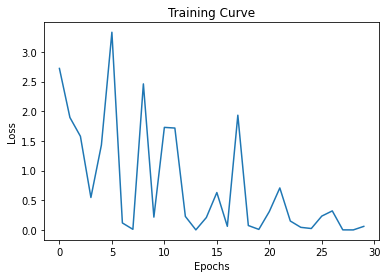

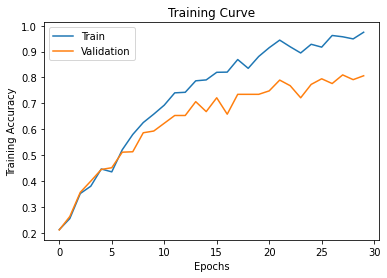

Final Training Accuracy: 0.9746428571428571
Final Validation Accuracy: 0.8066666666666666
Total time elapsed: 4394.02 seconds
True label: pop
prediction: pop


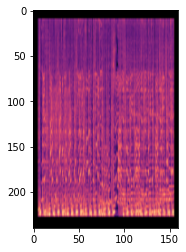

True label: rock
prediction: country


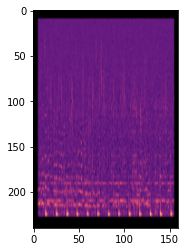

True label: hiphop
prediction: hiphop


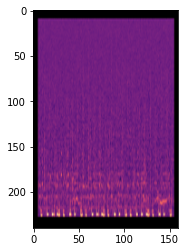

True label: classical
prediction: classical


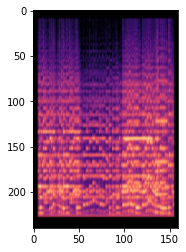

True label: hiphop
prediction: hiphop


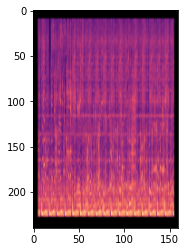

True label: reggae
prediction: reggae


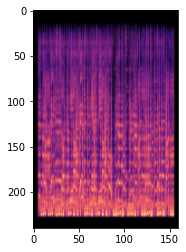

True label: blues
prediction: blues


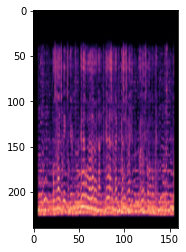

True label: rock
prediction: rock


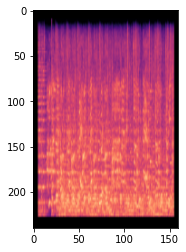

True label: hiphop
prediction: hiphop


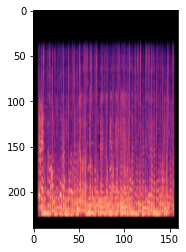

True label: blues
prediction: blues


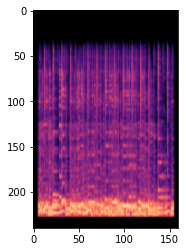

True label: jazz
prediction: blues


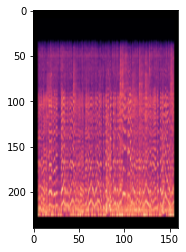

True label: country
prediction: country


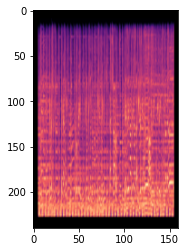

True label: pop
prediction: hiphop


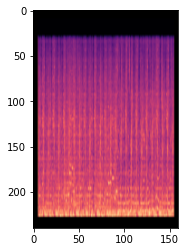

True label: metal
prediction: metal


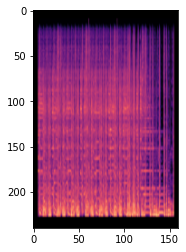

True label: reggae
prediction: blues


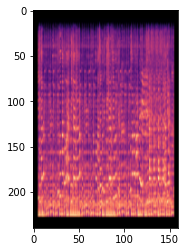

True label: disco
prediction: disco


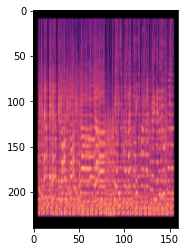

True label: disco
prediction: disco


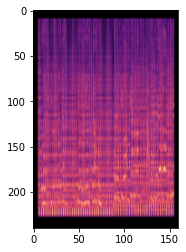

True label: reggae
prediction: blues


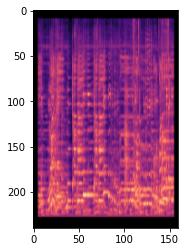

True label: hiphop
prediction: hiphop


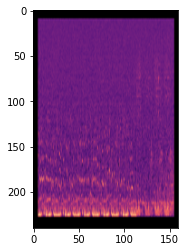

True label: disco
prediction: disco


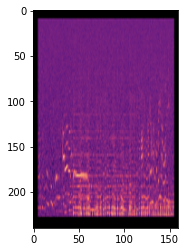

True label: blues
prediction: blues


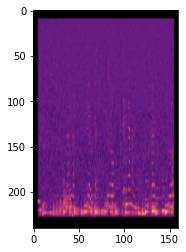

True label: country
prediction: country


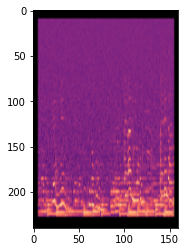

True label: jazz
prediction: jazz


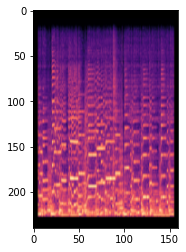

True label: hiphop
prediction: hiphop


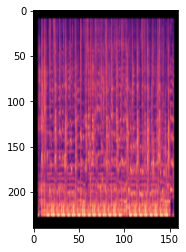

True label: rock
prediction: rock


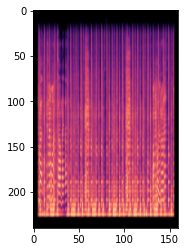

True label: classical
prediction: classical


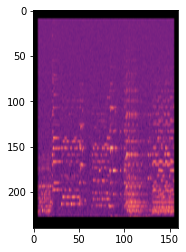

True label: pop
prediction: pop


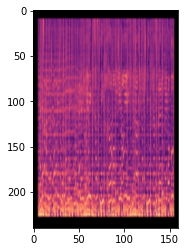

True label: disco
prediction: pop


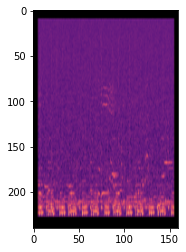

True label: hiphop
prediction: hiphop


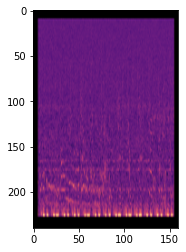

True label: reggae
prediction: blues


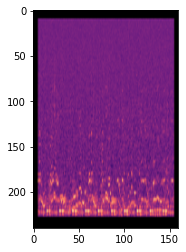

True label: reggae
prediction: reggae


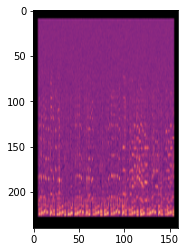

True label: disco
prediction: disco


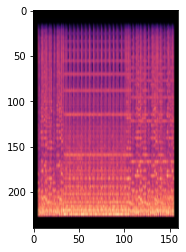

True label: classical
prediction: classical


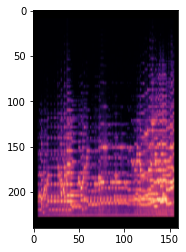

True label: pop
prediction: pop


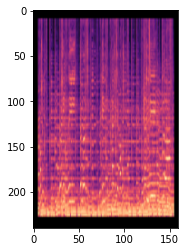

True label: reggae
prediction: reggae


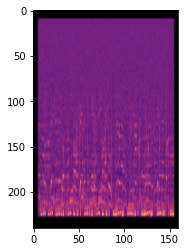

True label: jazz
prediction: jazz


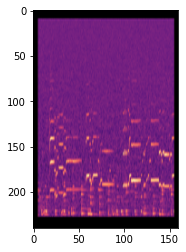

True label: country
prediction: country


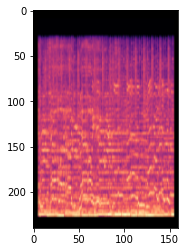

True label: reggae
prediction: hiphop


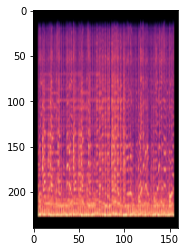

True label: country
prediction: country


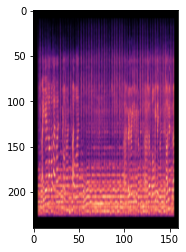

True label: hiphop
prediction: hiphop


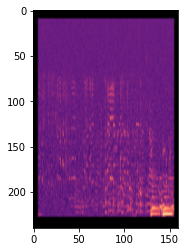

True label: blues
prediction: blues


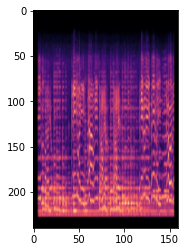

True label: rock
prediction: rock


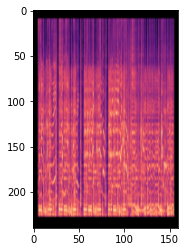

True label: classical
prediction: classical


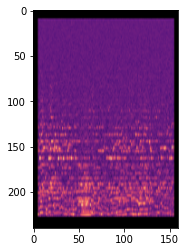

True label: disco
prediction: disco


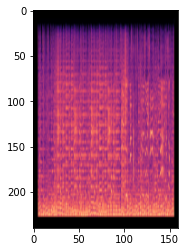

True label: blues
prediction: blues


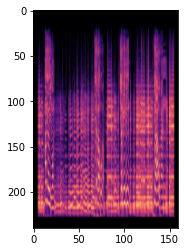

True label: reggae
prediction: reggae


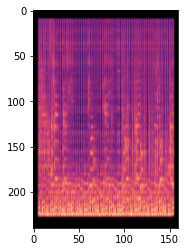

True label: jazz
prediction: jazz


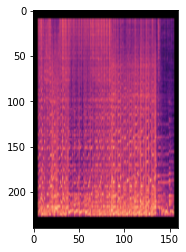

True label: pop
prediction: pop


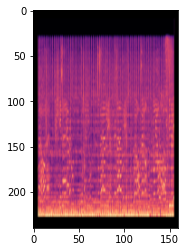

True label: hiphop
prediction: hiphop


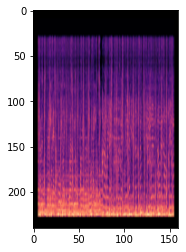

True label: classical
prediction: classical


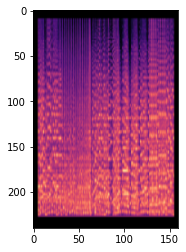

True label: reggae
prediction: pop


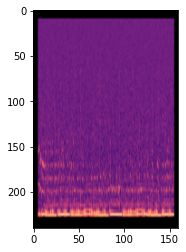

True label: disco
prediction: disco


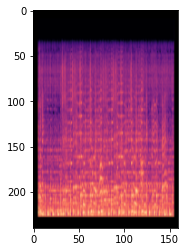

True label: blues
prediction: blues


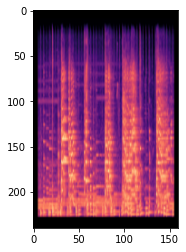

True label: blues
prediction: blues


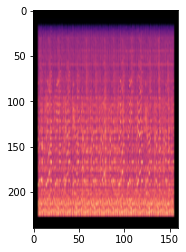

True label: hiphop
prediction: hiphop


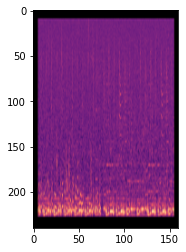

True label: blues
prediction: blues


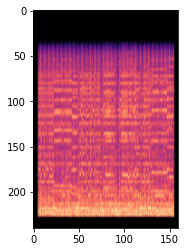

True label: rock
prediction: rock


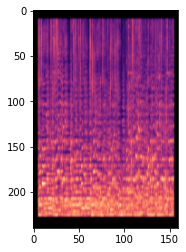

True label: rock
prediction: rock


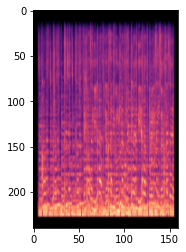

True label: classical
prediction: classical


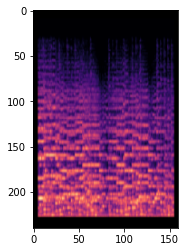

True label: country
prediction: country


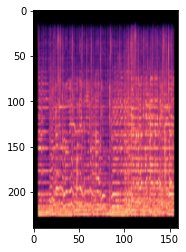

True label: metal
prediction: metal


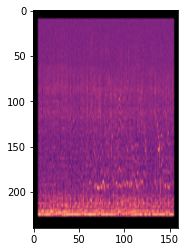

True label: pop
prediction: pop


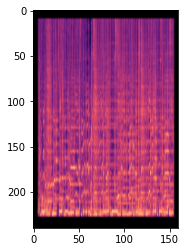

True label: blues
prediction: blues


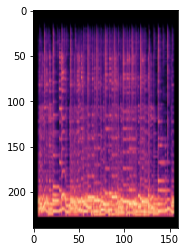

True label: metal
prediction: metal


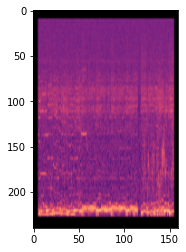

True label: blues
prediction: blues


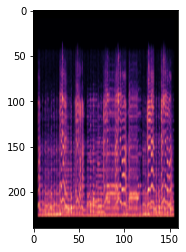

True label: pop
prediction: pop


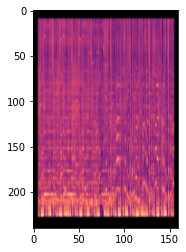

True label: hiphop
prediction: hiphop


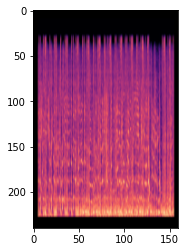

True label: reggae
prediction: reggae


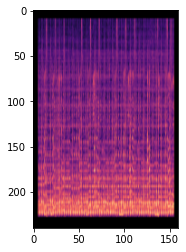

True label: disco
prediction: disco


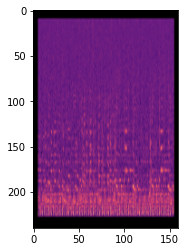

True label: metal
prediction: metal


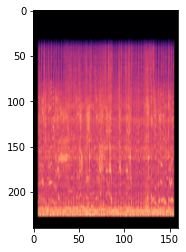

True label: blues
prediction: blues


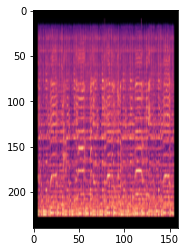

True label: pop
prediction: pop


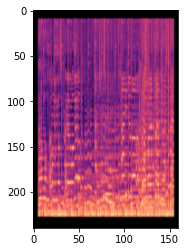

True label: blues
prediction: blues


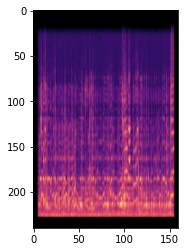

True label: reggae
prediction: reggae


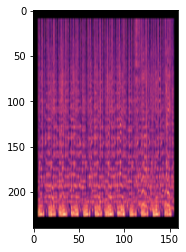

True label: disco
prediction: disco


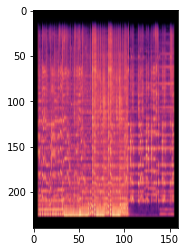

True label: country
prediction: reggae


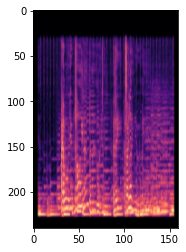

True label: reggae
prediction: reggae


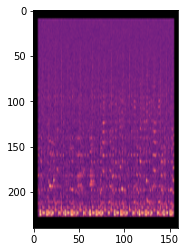

True label: pop
prediction: rock


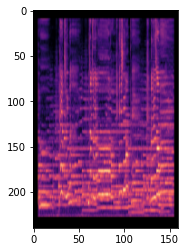

True label: classical
prediction: classical


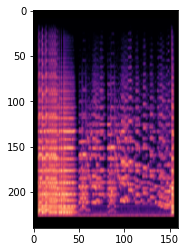

True label: jazz
prediction: jazz


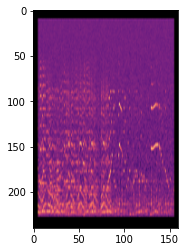

True label: jazz
prediction: jazz


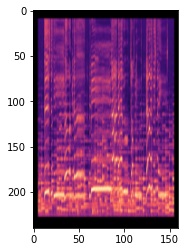

True label: reggae
prediction: reggae


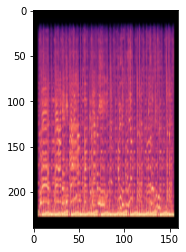

True label: disco
prediction: country


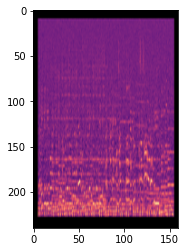

True label: pop
prediction: pop


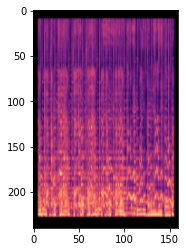

True label: pop
prediction: pop


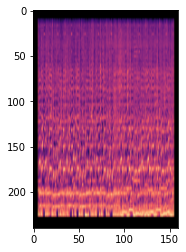

True label: country
prediction: country


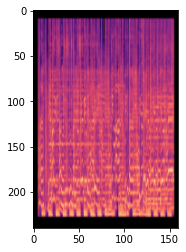

True label: pop
prediction: pop


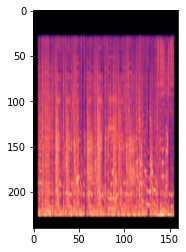

True label: blues
prediction: rock


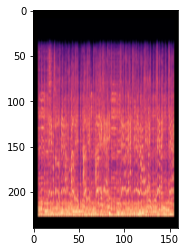

True label: reggae
prediction: reggae


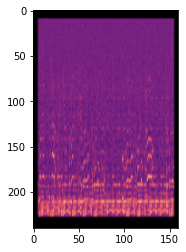

True label: classical
prediction: classical


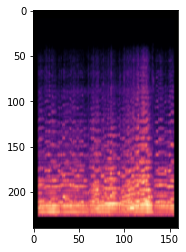

True label: jazz
prediction: jazz


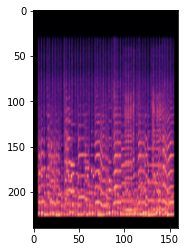

True label: reggae
prediction: reggae


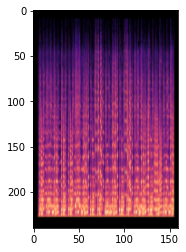

True label: metal
prediction: metal


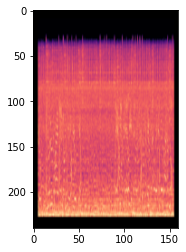

True label: reggae
prediction: country


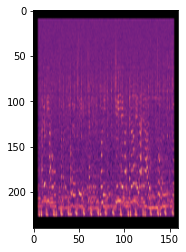

True label: country
prediction: blues


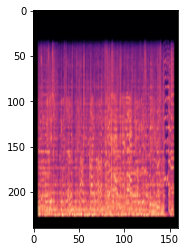

True label: metal
prediction: metal


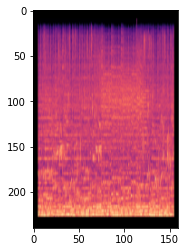

True label: rock
prediction: jazz


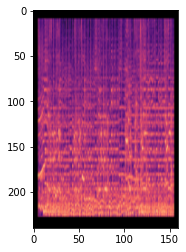

True label: disco
prediction: hiphop


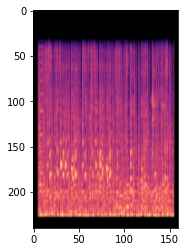

True label: disco
prediction: disco


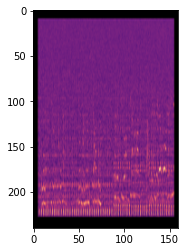

True label: reggae
prediction: reggae


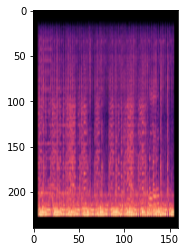

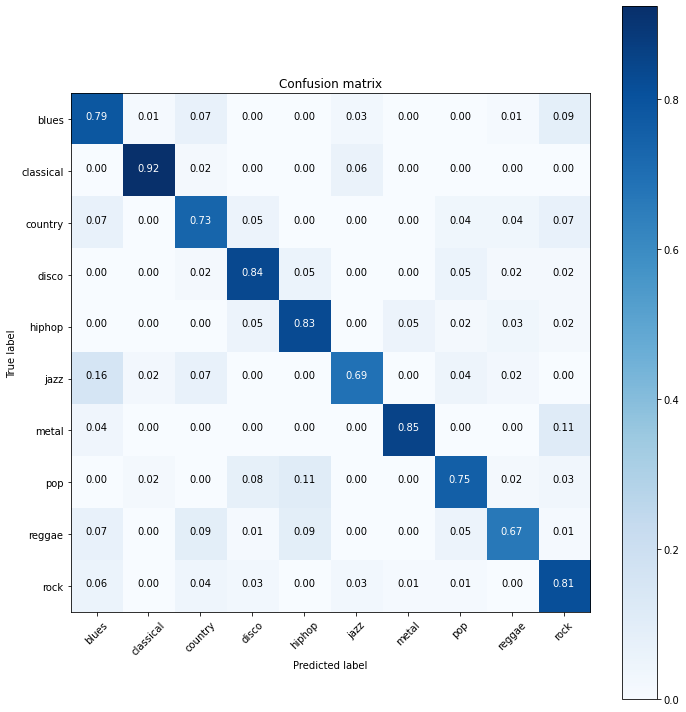

Test Accuracy:  0.785


In [ ]:
crnn = ConvolutionalRNN().to(device)
train(crnn, train_loader, val_loader, 
    batch_size=1, 
    num_epochs=30, 
    learning_rate=1e-4
)



# Demo

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


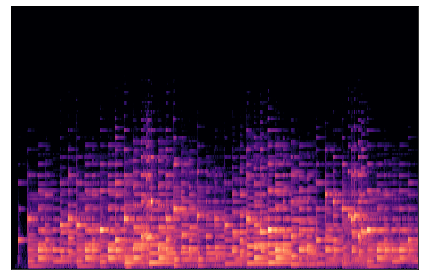

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

path = '/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/Demo/'
demo_audio = '/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/Demo/demo_classical.wav'
# mel spectogram generation

y,sample_rate=librosa.load(demo_audio,sr=None,)

#  Create a Mono Audio Signal 
y_mono = librosa.to_mono(y)

S = librosa.feature.melspectrogram(y=y_mono, sr=sample_rate, n_mels=128)
S_dB = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(S_dB, sr=sample_rate)
plt.tight_layout()

genre_folder = path + 'classical/'

if not os.path.isdir(genre_folder):
  os.mkdir(genre_folder)

figure = plt.gcf()
figure.patch.set_visible(False)

plt.savefig(genre_folder + 'demo_spectrogram',quality=95,dpi=200)

In [ ]:
# resizing 
import PIL
import os
import os.path
from PIL import Image

import torchvision
import torchvision.transforms as transforms

In [ ]:
Image.LOAD_TRUNCATED_IMAGES = True
# generate mel spectrogram for every audio file (using librosa library)
fdemo = '/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/Demo/classical'
for file in os.listdir(fdemo):
    f_img =fdemo+"/"+file
    img = Image.open(f_img)
    img = img.resize((240,160), Image.ANTIALIAS)
    print(str(file))
    img.save(f_img)

transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        transforms.Resize((240, 160))
    ])



img = np.asarray(img.convert('RGB'))
print(img.shape)
img = transform(img).permute(0,1,2)
print(img.shape)

demo_spectrogram (45).png
demo_spectrogram (44).png
demo_spectrogram (43).png
demo_spectrogram (42).png
demo_spectrogram (41).png
demo_spectrogram (40).png
demo_spectrogram (39).png
demo_spectrogram (38).png
demo_spectrogram (37).png
demo_spectrogram (36).png
demo_spectrogram (35).png
demo_spectrogram (34).png
demo_spectrogram (33).png
demo_spectrogram (32).png
demo_spectrogram (31).png
demo_spectrogram (30).png
demo_spectrogram (29).png
demo_spectrogram (28).png
demo_spectrogram (27).png
demo_spectrogram (26).png
demo_spectrogram (25).png
demo_spectrogram (24).png
demo_spectrogram (23).png
demo_spectrogram (22).png
demo_spectrogram (21).png
demo_spectrogram (20).png
demo_spectrogram (19).png
demo_spectrogram (18).png
demo_spectrogram (17).png
demo_spectrogram (16).png
demo_spectrogram (15).png
demo_spectrogram (14).png
demo_spectrogram (13).png
demo_spectrogram (12).png
demo_spectrogram (11).png
demo_spectrogram (10).png
demo_spectrogram (9).png
demo_spectrogram (8).png
demo_spectrogr

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:114: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:143.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()


In [ ]:
model = ConvolutionalRNN().to(device)


prediction = model(img.unsqueeze(0).to(device)).cpu().argmax().item()
print("Our model predicts: ", idx_to_class[prediction])

Our model predicts:  metal


# Demo II

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


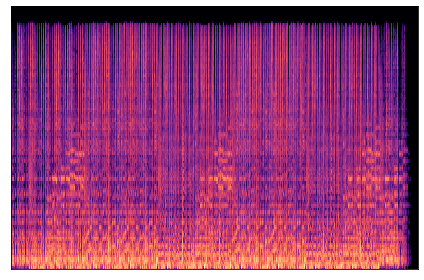

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

path = '/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/Demo/'
demo_audio = '/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/Demo/demo_jazz.mp3'
# mel spectogram generation

y,sample_rate=librosa.load(demo_audio,sr=None,)

#  Create a Mono Audio Signal 
y_mono = librosa.to_mono(y)

S = librosa.feature.melspectrogram(y=y_mono, sr=sample_rate, n_mels=128)
S_dB = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(S_dB, sr=sample_rate)
plt.tight_layout()

genre_folder = path + 'jazz/'

if not os.path.isdir(genre_folder):
  os.mkdir(genre_folder)

figure = plt.gcf()
figure.patch.set_visible(False)

plt.savefig(genre_folder + 'demo_spectrogram',quality=95,dpi=200)

In [ ]:
Image.LOAD_TRUNCATED_IMAGES = True
# generate mel spectrogram for every audio file (using librosa library)
fdemo = '/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/Demo/jazz'
for file in os.listdir(fdemo):
    f_img =fdemo+"/"+file
    img = Image.open(f_img)
    img = img.resize((240,160), Image.ANTIALIAS)
    print(str(file))
    img.save(f_img)

transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        transforms.Resize((240, 160))
    ])



img = np.asarray(img.convert('RGB'))
print(img.shape)
img = transform(img).permute(0,1,2)
print(img.shape)

demo_spectrogram.png
(160, 240, 3)
torch.Size([3, 240, 160])


In [ ]:
model = ConvolutionalRNN().to(device)


prediction = model(img.unsqueeze(0).to(device)).cpu().argmax().item()
print("Our model predicts: ", idx_to_class[prediction])

Our model predicts:  jazz


# Unseen data

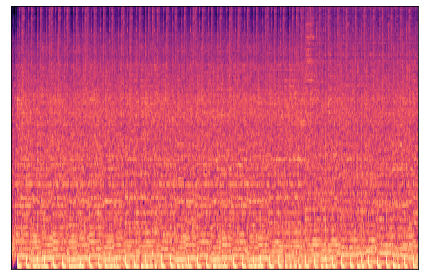

In [ ]:
# create list of all genres that will be used for genre classification
genres = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
# print(len(genres))

# path for image data location
# feature_path = '/content/spectrogram_data/'
feature_path = '/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project'

for i,genre in enumerate(genres):
  for number in range(3):
    y,sr=librosa.load('/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/UnseenData/'+genre+'/'+genre+str(number+1)+'.wav',sr=None,)

    #  Create a Mono Audio Signal 
    y_mono = librosa.to_mono(y)

    S = librosa.feature.melspectrogram(y=y_mono, sr=sr, n_mels=128, fmax=8000)
    S_dB = librosa.power_to_db(S, ref=np.max)
    librosa.display.specshow(S_dB, sr=sr, fmax=8000)
    plt.tight_layout()
    genre_folder = feature_path + '/udataproc/' + str(genre) + '/'
    if not os.path.isdir(genre_folder):
       os.mkdir(genre_folder)
    figure = plt.gcf()
    plt.savefig(genre_folder+genre+str(number+1),quality=95,dpi=200)


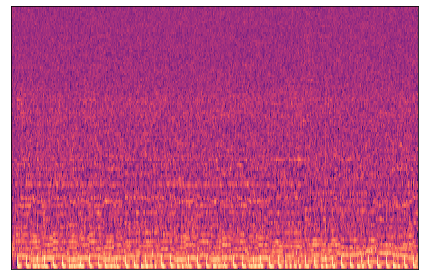

In [ ]:
import math

for i,genre in enumerate(genres):
  for number in range(3):
    if number < 10:
      y, sample_rate =librosa.load('/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/UnseenData/'+genre+'/'+genre+str(number+1)+'.wav',sr=None,)
      #print('Sample rate for '+genre+str(number+1)+': '+str(sample_rate))
    else:
      y, sample_rate=librosa.load('/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/UnseenData/'+genre+'/'+genre+str(number+1)+'.wav',sr=None,)
      #print('Sample rate for '+genre+str(number+1)+': '+str(sample_rate))

    #  Create a Mono Audio Signal 
    y_mono = librosa.to_mono(y)

    # adding the noise
    RMS=math.sqrt(np.mean(y_mono**2))
    noise=np.random.normal(0, RMS, y_mono.shape[0])
    signal_noise = y_mono+noise

    S = librosa.feature.melspectrogram(y=signal_noise, sr=sample_rate, n_mels=128, fmax=8000)
    S_dB = librosa.power_to_db(S, ref=np.max)
    librosa.display.specshow(S_dB, sr=sample_rate, fmax=8000)
    plt.tight_layout()
    genre_folder = feature_path + '/udataproc/' + str(genre) + '/'
    if not os.path.isdir(genre_folder):
       os.mkdir(genre_folder)
    figure = plt.gcf()
    figure.patch.set_visible(False)
    plt.savefig(genre_folder+genre+str(number+4),quality=95,dpi=200)
    

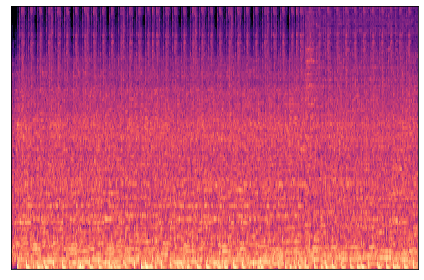

In [ ]:
for i,genre in enumerate(genres):
  for number in range(3):
    if number < 10:
      y, sample_rate =librosa.load('/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/UnseenData/'+genre+'/'+genre+str(number+1)+'.wav',sr=None,)
      #print('Sample rate for '+genre+str(number+1)+': '+str(sample_rate))
    else:
      y, sample_rate=librosa.load('/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/UnseenData/'+genre+'/'+genre+str(number+1)+'.wav',sr=None,)
      #print('Sample rate for '+genre+str(number+1)+': '+str(sample_rate))

    #  Create a Mono Audio Signal 
    y_mono = librosa.to_mono(y)

    # Changing the pitch
    y_pitch = librosa.effects.pitch_shift(y_mono,sample_rate,n_steps=-5)

    S = librosa.feature.melspectrogram(y=y_pitch, sr=sample_rate, n_mels=128, fmax=8000)
    S_dB = librosa.power_to_db(S, ref=np.max)
    librosa.display.specshow(S_dB, sr=sample_rate, fmax=8000)
    plt.tight_layout()

    genre_folder = feature_path + '/udataproc/' + str(genre) + '/'
    if not os.path.isdir(genre_folder):
       os.mkdir(genre_folder)
    figure = plt.gcf()
    figure.patch.set_visible(False)
    plt.savefig(genre_folder+genre+str(number+7),quality=95,dpi=200)

In [ ]:
data_path = '/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/dataset'

    # resize, normalize, and convert to Tensor
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    transforms.Resize((240, 160))
])
   
dataset = torchvision.datasets.ImageFolder(data_path,  transform=transform)
data_size = len(dataset)


un_path = '/content/drive/MyDrive/ECE Year 3/Semester 2/APS360/Group Project/udataproc'
transform = transforms.Compose([transforms.Resize((240,160)), transforms.ToTensor()])
unset = torchvision.datasets.ImageFolder(un_path, transform=transform)
unsize = len(unset)

np.random.seed(1000) # Fixed numpy random seed for reproducible shuffling


# randomize indices
indices = np.arange(data_size)
#indices_un = np.arange(unsize)
np.random.shuffle(indices)
#np.random.shuffle(indices_un)

maxset =  torch.utils.data.ConcatDataset([unset,dataset])
msize = len(maxset)
print(msize)
#np.random.seed(1000)

#indices_max = np.arange(msize)
#np.random.shuffle(indices_max)

# split 70/15/15
split1 = int(data_size)
print(split1)
# generate DataLoader object
train_sampler = torch.utils.data.SubsetRandomSampler(indices[:split1])
r1_loader = torch.utils.data.DataLoader(
    maxset, 
    batch_size = 32, 
    sampler=train_sampler
)

4090
4000


True label: classical
prediction: classical


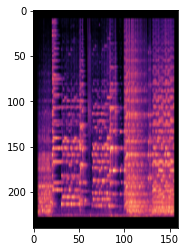

True label: jazz
prediction: metal


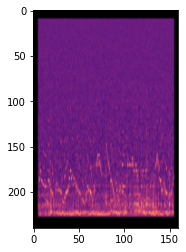

True label: blues
prediction: metal


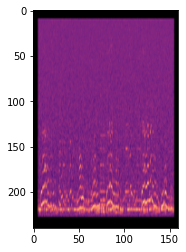

True label: classical
prediction: classical


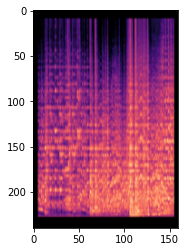

True label: jazz
prediction: reggae


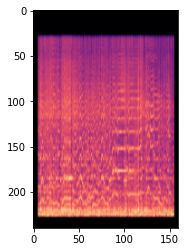

True label: jazz
prediction: jazz


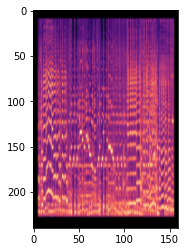

True label: metal
prediction: hiphop


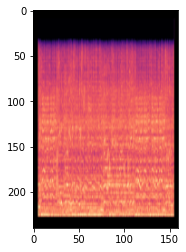

True label: country
prediction: rock


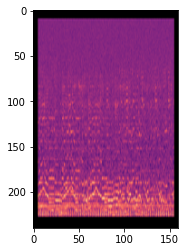

True label: hiphop
prediction: hiphop


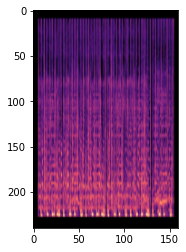

True label: rock
prediction: rock


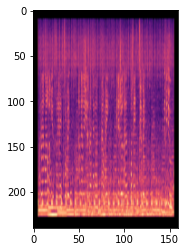

True label: metal
prediction: reggae


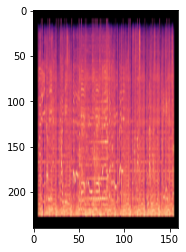

True label: country
prediction: country


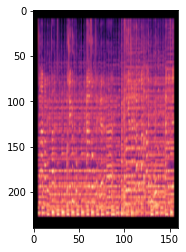

True label: blues
prediction: blues


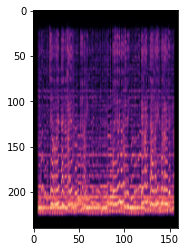

True label: country
prediction: rock


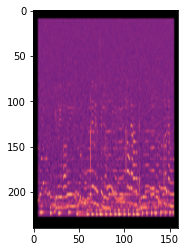

True label: hiphop
prediction: hiphop


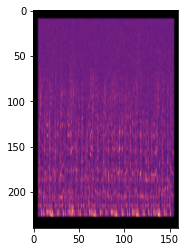

True label: disco
prediction: hiphop


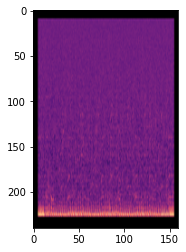

True label: disco
prediction: pop


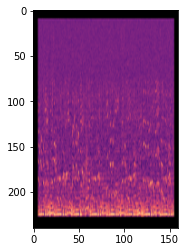

True label: classical
prediction: rock


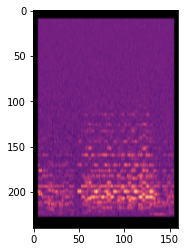

True label: reggae
prediction: pop


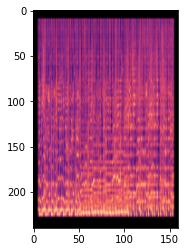

True label: pop
prediction: pop


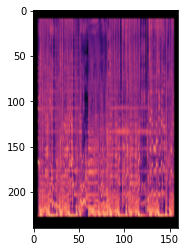

True label: hiphop
prediction: hiphop


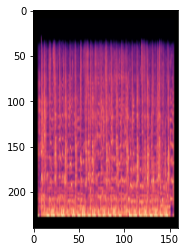

True label: reggae
prediction: hiphop


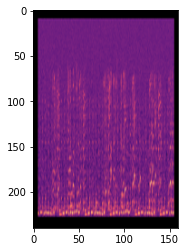

True label: pop
prediction: pop


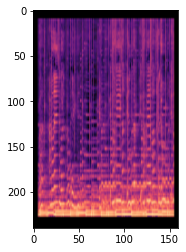

True label: reggae
prediction: disco


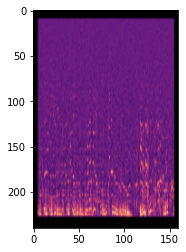

True label: country
prediction: rock


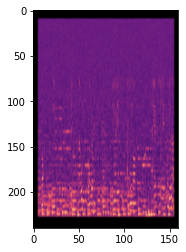

True label: pop
prediction: pop


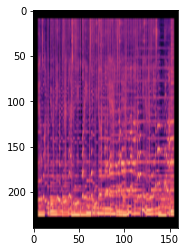

True label: country
prediction: jazz


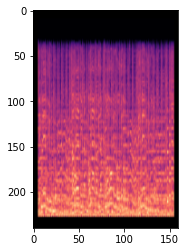

True label: disco
prediction: disco


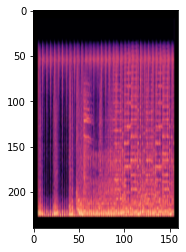

True label: hiphop
prediction: hiphop


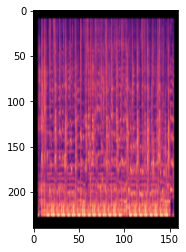

True label: country
prediction: rock


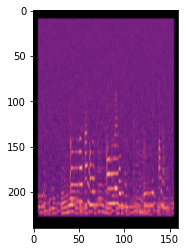

True label: disco
prediction: pop


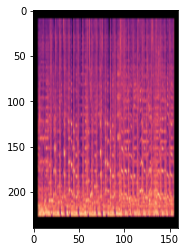

True label: country
prediction: rock


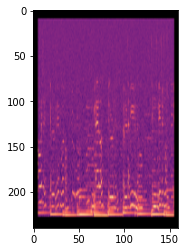

True label: jazz
prediction: rock


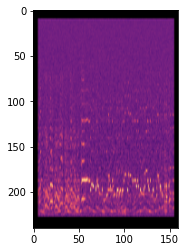

True label: blues
prediction: blues


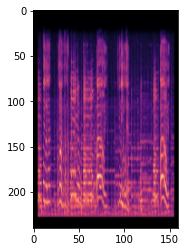

True label: jazz
prediction: jazz


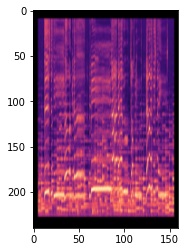

True label: pop
prediction: hiphop


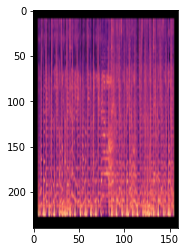

True label: reggae
prediction: jazz


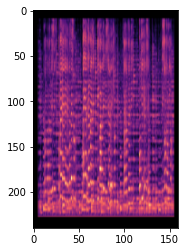

True label: metal
prediction: blues


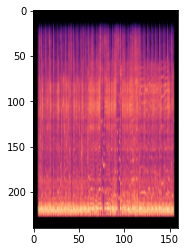

True label: pop
prediction: pop


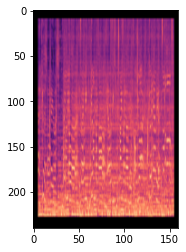

True label: classical
prediction: rock


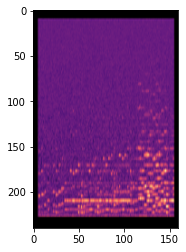

True label: disco
prediction: rock


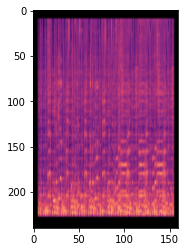

True label: jazz
prediction: blues


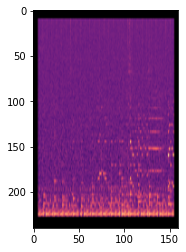

True label: hiphop
prediction: reggae


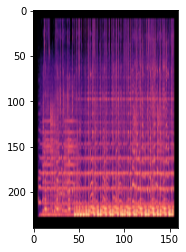

True label: metal
prediction: rock


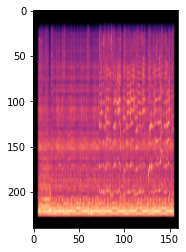

True label: disco
prediction: disco


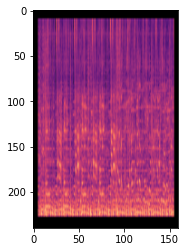

True label: reggae
prediction: hiphop


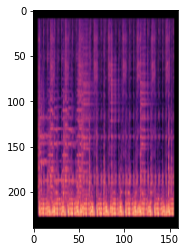

True label: blues
prediction: blues


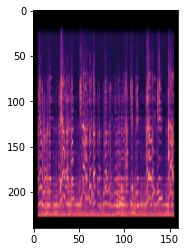

True label: metal
prediction: rock


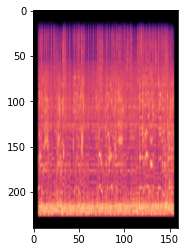

True label: rock
prediction: rock


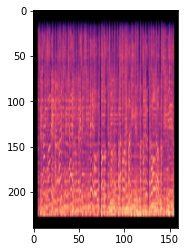

True label: metal
prediction: metal


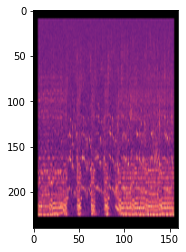

True label: rock
prediction: hiphop


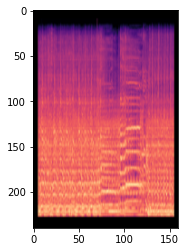

True label: blues
prediction: jazz


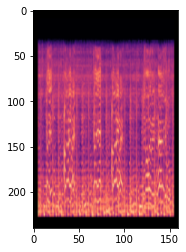

True label: disco
prediction: disco


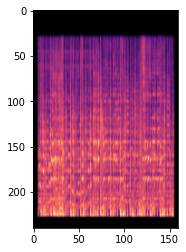

True label: country
prediction: blues


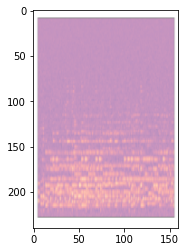

True label: metal
prediction: hiphop


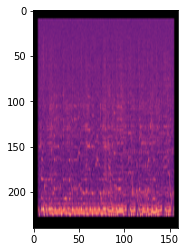

True label: classical
prediction: classical


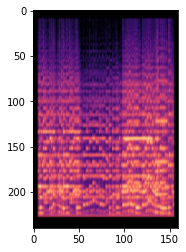

True label: rock
prediction: rock


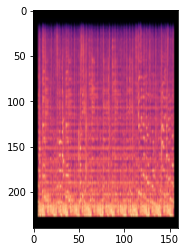

True label: classical
prediction: classical


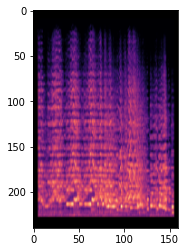

True label: hiphop
prediction: hiphop


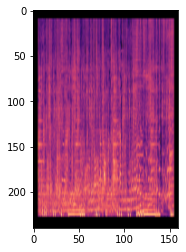

True label: classical
prediction: classical


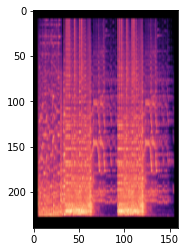

True label: hiphop
prediction: reggae


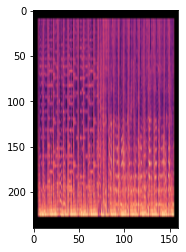

True label: disco
prediction: reggae


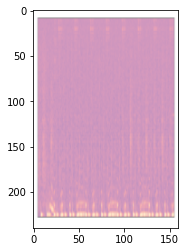

True label: reggae
prediction: reggae


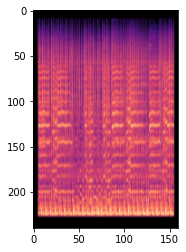

True label: classical
prediction: classical


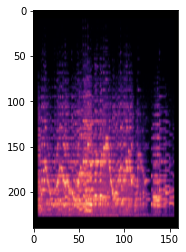

True label: disco
prediction: country


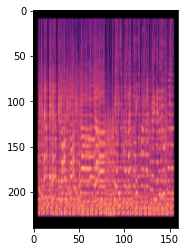

True label: reggae
prediction: blues


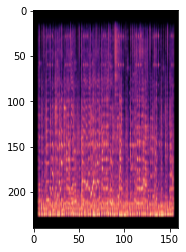

True label: reggae
prediction: jazz


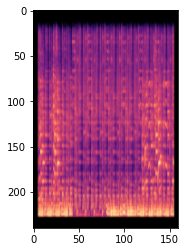

True label: rock
prediction: rock


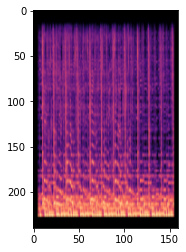

True label: hiphop
prediction: hiphop


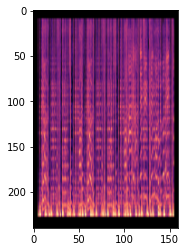

True label: pop
prediction: pop


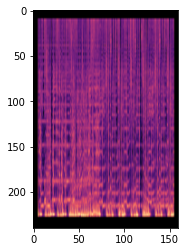

True label: classical
prediction: rock


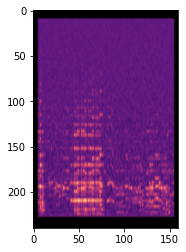

True label: pop
prediction: pop


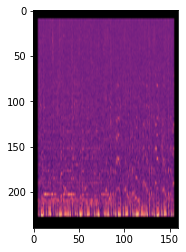

True label: pop
prediction: disco


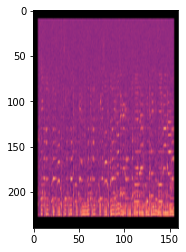

True label: disco
prediction: blues


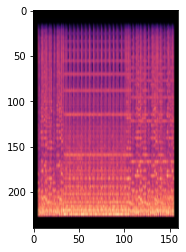

True label: jazz
prediction: jazz


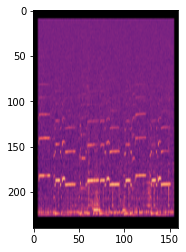

True label: reggae
prediction: reggae


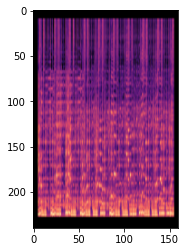

True label: pop
prediction: pop


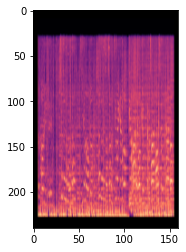

True label: blues
prediction: jazz


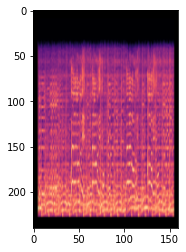

True label: blues
prediction: blues


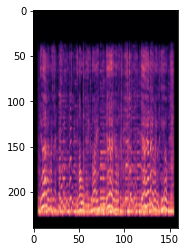

True label: jazz
prediction: classical


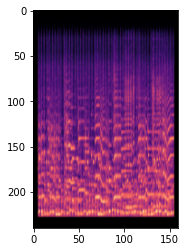

True label: disco
prediction: disco


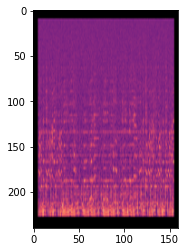

True label: hiphop
prediction: hiphop


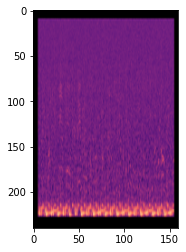

True label: disco
prediction: reggae


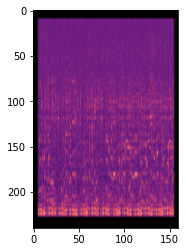

True label: pop
prediction: pop


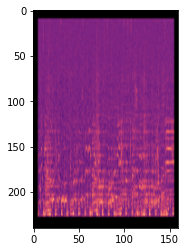

True label: blues
prediction: blues


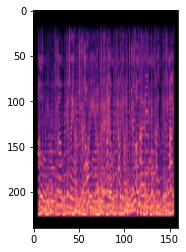

True label: metal
prediction: rock


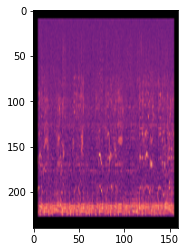

True label: country
prediction: country


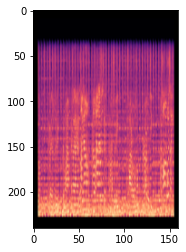

True label: metal
prediction: blues


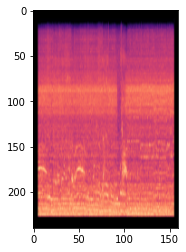

True label: pop
prediction: disco


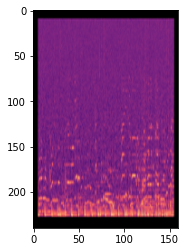

True label: classical
prediction: classical


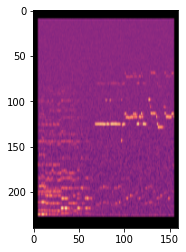

True label: pop
prediction: rock


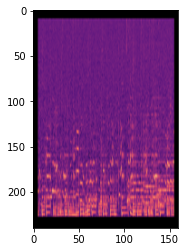

True label: reggae
prediction: hiphop


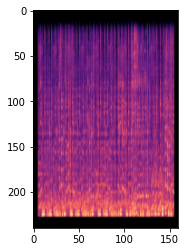

True label: country
prediction: country


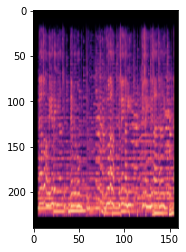

True label: metal
prediction: metal


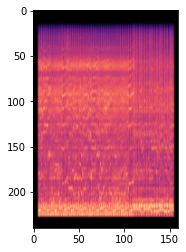

True label: pop
prediction: reggae


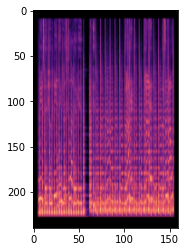

True label: disco
prediction: rock


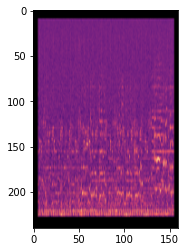

True label: reggae
prediction: blues


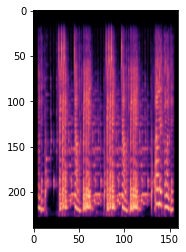

True label: metal
prediction: metal


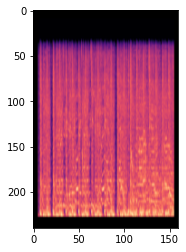

True label: hiphop
prediction: hiphop


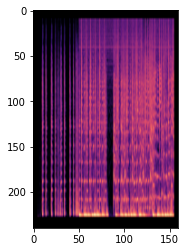

True label: metal
prediction: blues


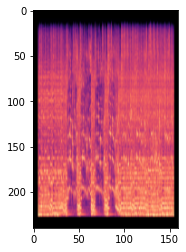

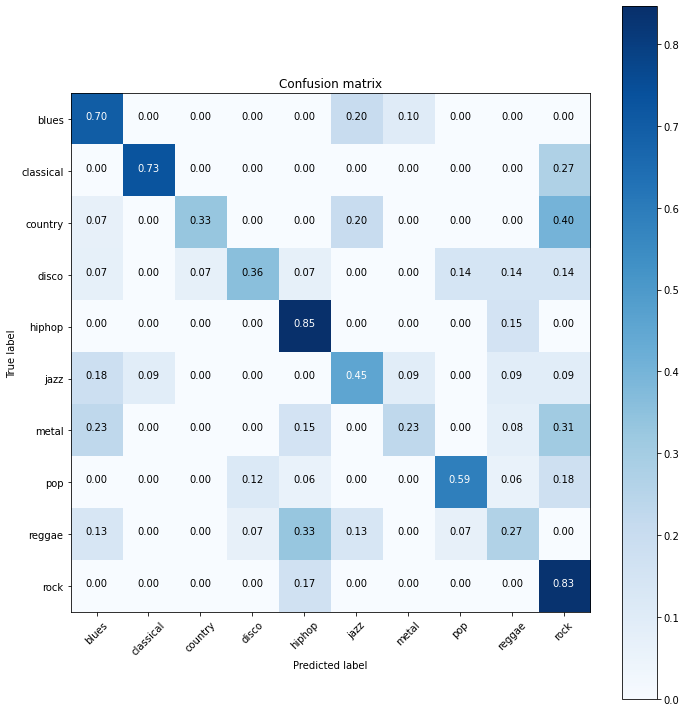

Test Accuracy:  0.61725


In [ ]:
print("Test Accuracy: ",get_accuracy(crnn,r1_loader, test = True))